# Deterministic vs Stochastic Rumor Spreading Model with Varying Beta

In this notebook, we compare **Deterministic** and **Stochastic** implementations of the Rumor Spreading model across different transmission rates (Beta).

The model follows the same compartmental structure as the SIR epidemic model, re-interpreted for information/rumor propagation.

## Compartments

| Label | SIR Equivalent | Meaning |
|-------|---------------|---------|
| **I** — Ignorants | Susceptible | Have not yet heard the rumor |
| **S** — Spreaders | Infectious | Actively spreading the rumor |
| **R** — Stiflers | Recovered | Know the rumor but have stopped spreading |

## Mathematical Model (Discrete Time)

$$
\begin{aligned}
I(t+1) &= I(t) - \lambda \, I(t) \, \frac{S(t)}{N} \\
S(t+1) &= S(t) + \lambda \, I(t) \, \frac{S(t)}{N} - \alpha \, S(t) \frac{S(t)}{N} - \alpha \, S(t) \frac{R(t)}{N}\\
R(t+1) &= R(t) - \alpha \, S(t) \frac{S(t)+R(t)}{N}
\end{aligned}
$$

Where:
- $S(t), I(t), R(t)$: Proportions of Ignorants, Spreaders, and Stiflers.
- $\beta$: Rumor spreading rate (probability an Ignorant becomes a Spreader per contact with a Spreader).
- $\alpha$: Stifling rate (probability a Spreader stops spreading per time step).
- $R_0 = \beta / \alpha$: Basic reproduction number — average number of new spreaders one spreader generates.

### Deterministic Approach
Solves the equations exactly. Represents the average behavior of an infinitely large population.

### Stochastic Approach
Simulates individual contact probabilities in a finite population ($N$). Captures variability and potential die-out events.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import fsolve

## 1. Simulation Functions

In [2]:
def run_deterministic(lamb, alpha, T_max, S0_prop=0.01):
    """
    Deterministic rumor spreading model (mean-field / compartmental).
    S = Ignorants, I = Spreaders, R = Stiflers
    """
    I0 = 1 - S0_prop
    R0 = 0

    S_hist = [S0_prop]
    I_hist = [I0]
    R_hist = [R0]

    for t in range(T_max):
        St, It, Rt = S_hist[-1], I_hist[-1], R_hist[-1]

        # Deterministic updates
        new_spreaders = lamb * St * It
        new_stiflers  = alpha * St * (St+Rt)

        next_I = It - new_spreaders
        next_S = St + new_spreaders - new_stiflers
        next_R = Rt + new_stiflers

        S_hist.append(next_S)
        I_hist.append(next_I)
        R_hist.append(next_R)

    return np.array(S_hist), np.array(I_hist), np.array(R_hist)


def run_stochastic(N, lamb, alpha, T_max, S0_prop=0.01):
    """
    Stochastic rumor spreading model using binomial sampling.
    S = Ignorants, I = Spreaders, R = Stiflers
    """
    S = int(S0_prop * N)
    I = N - S
    R = 0

    S_hist, I_hist, R_hist = [S], [I], [R]

    for t in range(T_max):
        # Probability an Ignorant encounters a Spreader and adopts the rumor
        p_spread = lamb * S / N  # depends on Spreader prevalence
        p_spread = min(max(p_spread, 0), 1)

        # Probability a Spreader contacts another Spreader or Stifler and stops spreading
        p_stifle = alpha * (S + R) / N
        p_stifle = min(max(p_stifle, 0), 1)

        # Random events
        new_spreaders = np.random.binomial(I, p_spread)  # applied to Ignorants
        new_stiflers  = np.random.binomial(S, p_stifle)  # applied to Spreaders

        I = I - new_spreaders
        S = S + new_spreaders - new_stiflers
        R = R + new_stiflers

        S, I, R = max(S, 0), max(I, 0), max(R, 0)

        S_hist.append(S)
        I_hist.append(I)
        R_hist.append(R)

    return np.array(S_hist)/N, np.array(I_hist)/N, np.array(R_hist)/N

## 2. Running Simulations (Varying $\lambda$)

In [3]:
lambdas = [0.25, 0.40, 0.55, 0.70, 0.85]
gamma = 0.1
T_max = 100
N = 1000

results_det   = {}
results_stoch = {}

for l in lambdas:
    results_det[l]   = run_deterministic(l, gamma, T_max)
    results_stoch[l] = run_stochastic(N, l, gamma, T_max)

## 3. Visualization

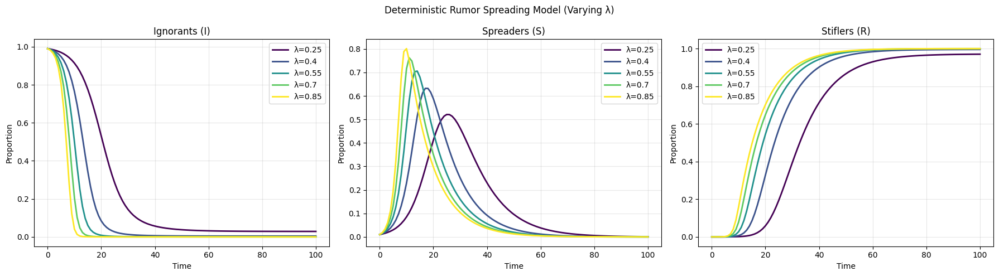

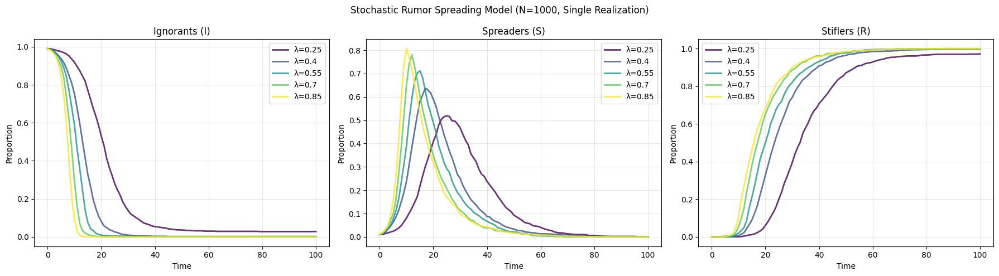

In [4]:
t_grid = range(T_max + 1)
colors = plt.cm.viridis(np.linspace(0, 1, len(lambdas)))

compartment_labels = ["Ignorants (I)", "Spreaders (S)", "Stiflers (R)"]

# --- Deterministic Plot ---
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle("Deterministic Rumor Spreading Model (Varying λ)")

for i, l in enumerate(lambdas):
    S, I, R = results_det[l]
    axes[1].plot(t_grid, S, label=f'λ={l}', color=colors[i], lw=2)
    axes[0].plot(t_grid, I, label=f'λ={l}', color=colors[i], lw=2)
    axes[2].plot(t_grid, R, label=f'λ={l}', color=colors[i], lw=2)

for ax, title in zip(axes, compartment_labels):
    ax.set_title(title)
    ax.set_xlabel("Time")
    ax.set_ylabel("Proportion")
    ax.legend()
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# --- Stochastic Plot ---
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle(f"Stochastic Rumor Spreading Model (N={N}, Single Realization)")

for i, l in enumerate(lambdas):
    S, I, R = results_stoch[l]
    axes[1].plot(t_grid, S, label=f'λ={l}', color=colors[i], lw=2, alpha=0.8)
    axes[0].plot(t_grid, I, label=f'λ={l}', color=colors[i], lw=2, alpha=0.8)
    axes[2].plot(t_grid, R, label=f'λ={l}', color=colors[i], lw=2, alpha=0.8)

for ax, title in zip(axes, compartment_labels):
    ax.set_title(title)
    ax.set_xlabel("Time")
    ax.set_ylabel("Proportion")
    ax.legend()
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

## 4. Stifler Inflection Point (Final Rumor Reach vs $R_0$)

As in the SIR epidemic model, the rumor model has a threshold at $R_0 = \beta / \gamma = 1$.
Below this threshold the rumor dies out quickly; above it the rumor propagates through a substantial fraction of the population.

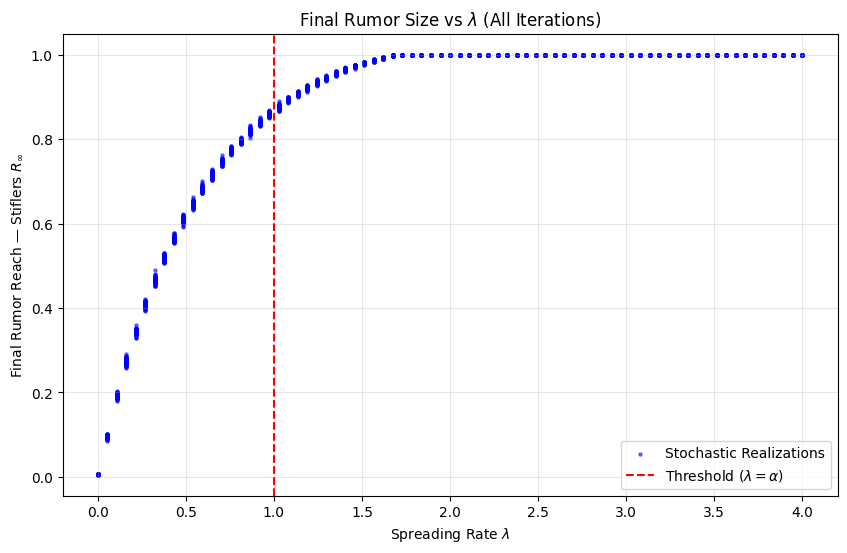

In [5]:
lambdas_sweep = np.linspace(0, 4, 75)
alpha_sweep = 1
N_sweep = 10000

results_stoch_sweep = {}

for l in lambdas_sweep:
    results_stoch_sweep[l] = []
    for _ in range(50):
        results_stoch_sweep[l].append(run_stochastic(N_sweep, l, alpha_sweep, T_max, S0_prop=0.01))

x_vals = []
y_vals = []

for l, realizations in results_stoch_sweep.items():
    for S, I, R in realizations:
        final_stiflers = R[-1]
        x_vals.append(l)
        y_vals.append(final_stiflers)

plt.figure(figsize=(10, 6))
plt.scatter(x_vals, y_vals, alpha=0.5, s=5, color='blue', label='Stochastic Realizations')
plt.xlabel(r'Spreading Rate $\lambda$')
plt.ylabel(r'Final Rumor Reach — Stiflers $R_\infty$')
plt.title(r'Final Rumor Size vs $\lambda$ (All Iterations)')
plt.grid(True, alpha=0.3)
plt.axvline(x=alpha_sweep, color='red', linestyle='--', label=r'Threshold ($\lambda = \alpha$)')
plt.legend()
plt.show()

## 5. Theoretical vs Simulated Final Rumor Reach

The theoretical final size $R_\infty$ satisfies the same transcendental equation as the SIR epidemic model:

$$
R_\infty = 1 - S_0 \, e^{-R_0 \, R_\infty}
$$

We compare this against the deterministic simulation output for each $\beta$.

In [6]:
print(f"{'Lambda':<10} {'R0 (lambda/alpha)':<25} {'Simulated Final Reach':<27} {'Theoretical Final Reach'}")
print("-" * 90)

for l in lambdas:
    # Simulated final stifler proportion from deterministic run
    simulated_final_R = results_det[l][2][-1]

    # Basic reproduction number
    R0_val = l / gamma

    # Theoretical final size: R_inf = 1 - S0 * exp(-R0 * R_inf)
    def final_size_eq(r_inf):
        s0_val = 1 - 0.01  # Initial proportion of ignorants
        return r_inf - (1 - s0_val * np.exp(-R0_val * r_inf))

    theoretical_final_R = fsolve(final_size_eq, 0.5)[0]

    print(f"{l:<10.2f} {R0_val:<25.2f} {simulated_final_R:<27.4f} {theoretical_final_R:.4f}")

Lambda     R0 (lambda/alpha)         Simulated Final Reach       Theoretical Final Reach
------------------------------------------------------------------------------------------
0.25       2.50                      0.9704                      0.8941
0.40       4.00                      0.9954                      0.9804
0.55       5.50                      0.9993                      0.9959
0.70       7.00                      0.9999                      0.9991
0.85       8.50                      0.9999                      0.9998


## 6. Visual Spread Representation (Calls external file)

Simulates the rumor spreading model on a network and saves the result as a GIF using `RumorVisual.py`.

In [7]:
import importlib
import RumorVisual
importlib.reload(RumorVisual)  # pick up any changes to RumorVisual.py
import networkx as nx

# Simulation parameters
num_nodes = 100
lamb      = 0.3   # spreading rate (λ)
alpha     = 0.1   # stifling rate (α)
num_steps = 100

# 1. Erdos-Renyi random graph
er_graph = nx.erdos_renyi_graph(num_nodes, 0.1)
RumorVisual.visualize_rumor(er_graph, "ER_Graph", lamb, alpha, num_steps)

# 2. Watts-Strogatz small-world graph
ws_graph = nx.watts_strogatz_graph(num_nodes, k=4, p=0.1)
RumorVisual.visualize_rumor(ws_graph, "WS_Graph", lamb, alpha, num_steps)

# 3. Barabasi-Albert scale-free graph
ba_graph = nx.barabasi_albert_graph(num_nodes, 2)
RumorVisual.visualize_rumor(ba_graph, "BA_Graph", lamb, alpha, num_steps)

# 4. Configuration Model (using BA degree sequence)
ba_degrees = [d for n, d in ba_graph.degree()]
config_model = nx.configuration_model(ba_degrees)
config_model = nx.Graph(config_model)           # MultiGraph -> simple Graph
config_model.remove_edges_from(nx.selfloop_edges(config_model))
RumorVisual.visualize_rumor(config_model, "Config_Model", lamb, alpha, num_steps)

[INFO] Visualizing ER_Graph (λ=0.3, α=0.1)
[INFO] Initial patient zero: 89


Simulating rumor spread on ER_Graph:   5%|▌         | 5/100 [00:01<00:28,  3.39it/s]

[INFO] Epidemic ended at step 6
[INFO] Creating GIF...


[INFO] GIF saved as 'output\ER_Graph_Rumor_animation.gif'
[INFO] Frames directory deleted.
[INFO] Visualizing WS_Graph (λ=0.3, α=0.1)
[INFO] Initial patient zero: 8


Simulating rumor spread on WS_Graph: 100%|██████████| 100/100 [00:25<00:00,  3.98it/s]


[INFO] Creating GIF...
[INFO] GIF saved as 'output\WS_Graph_Rumor_animation.gif'
[INFO] Frames directory deleted.
[INFO] Visualizing BA_Graph (λ=0.3, α=0.1)
[INFO] Initial patient zero: 3


Simulating rumor spread on BA_Graph: 100%|██████████| 100/100 [00:27<00:00,  3.62it/s]


[INFO] Creating GIF...
[INFO] GIF saved as 'output\BA_Graph_Rumor_animation.gif'
[INFO] Frames directory deleted.
[INFO] Visualizing Config_Model (λ=0.3, α=0.1)
[INFO] Initial patient zero: 3


Simulating rumor spread on Config_Model: 100%|██████████| 100/100 [00:24<00:00,  4.16it/s]


[INFO] Creating GIF...
[INFO] GIF saved as 'output\Config_Model_Rumor_animation.gif'
[INFO] Frames directory deleted.


--- ER_Graph ---


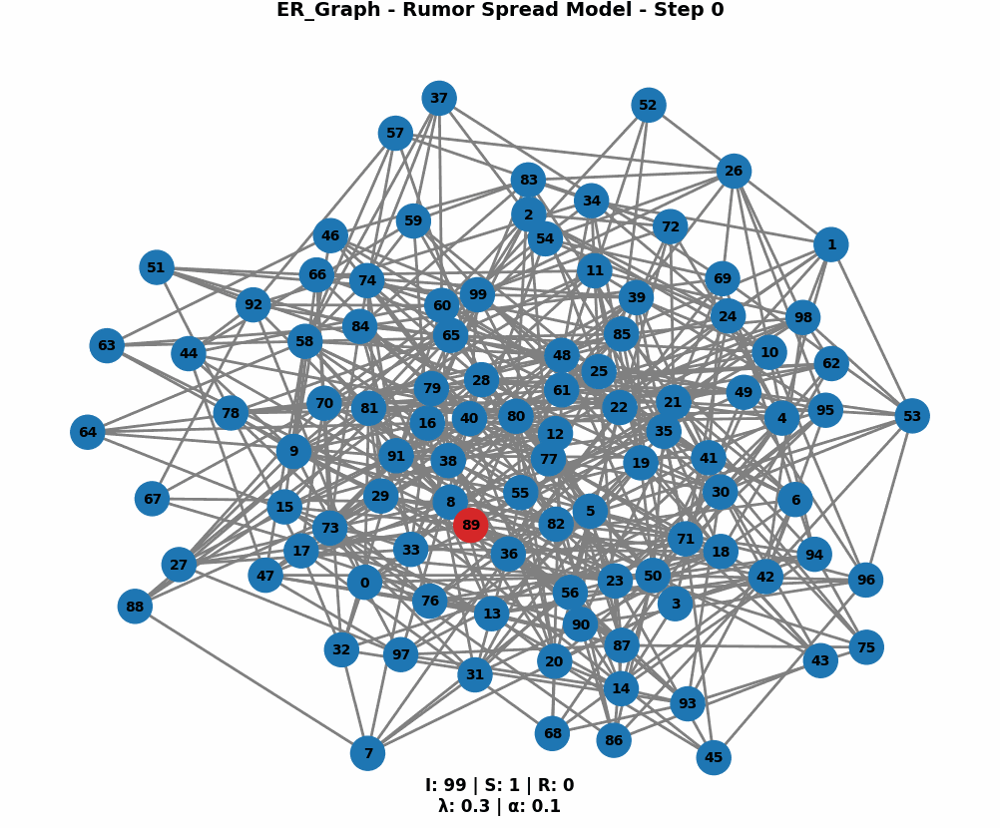

--- WS_Graph ---


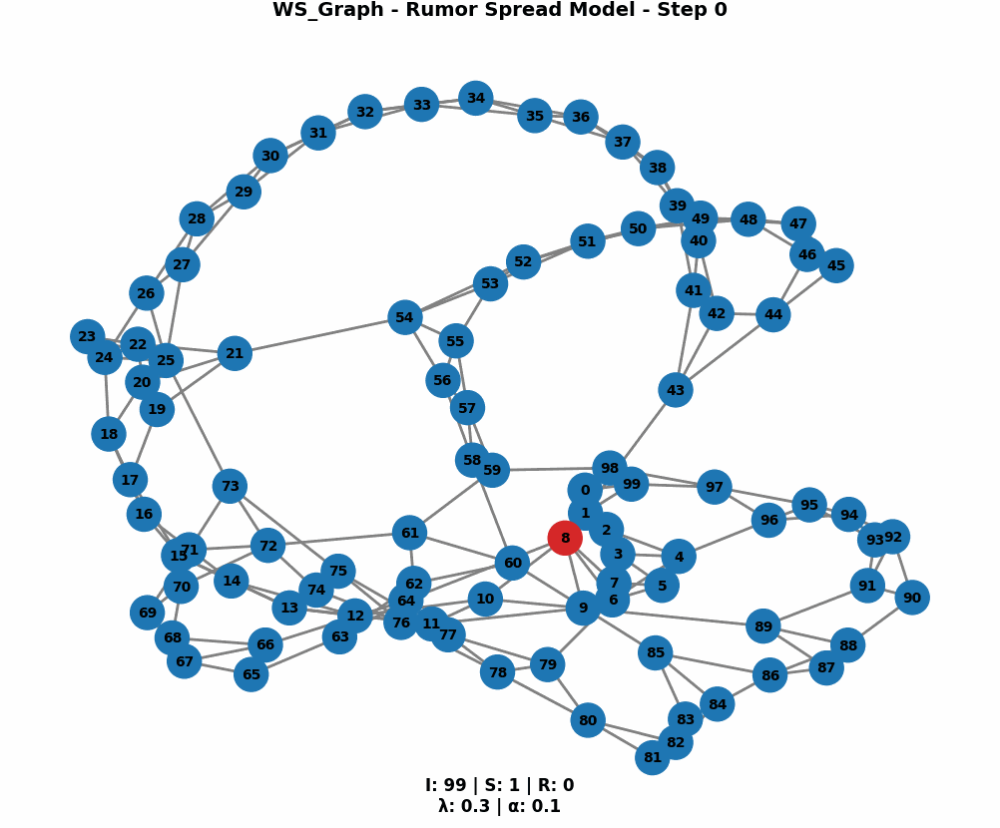

--- BA_Graph ---


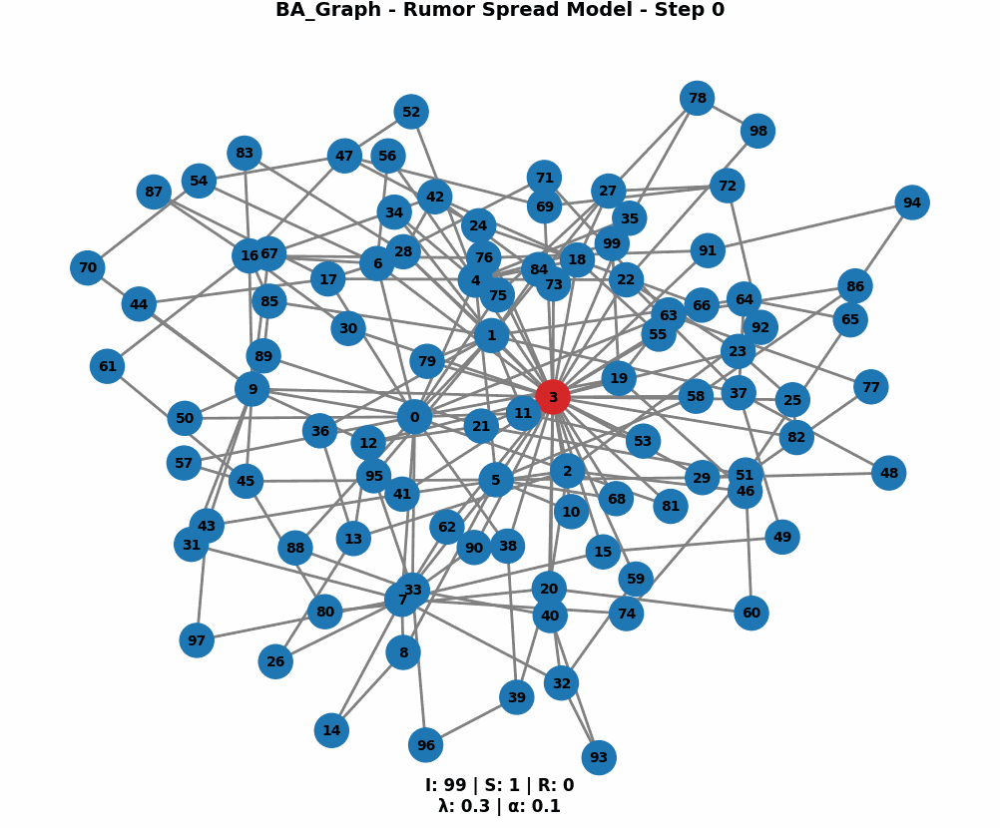

--- Config_Model ---


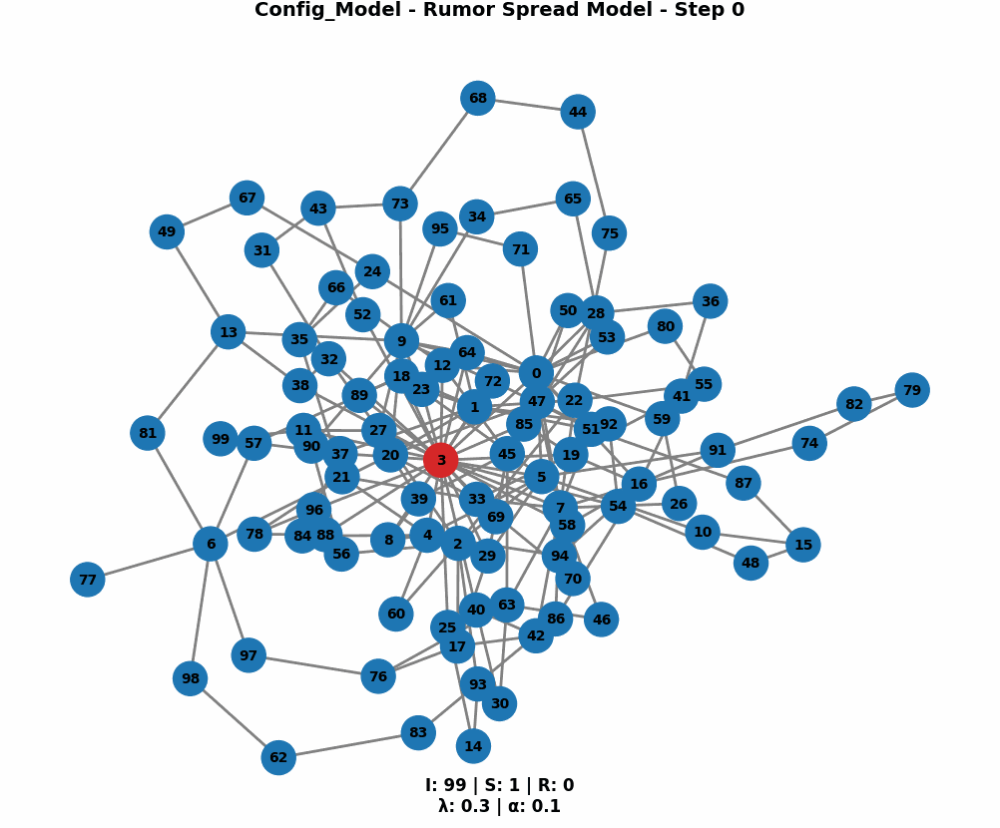

In [9]:
from IPython.display import Image, display

graph_names = ["ER_Graph", "WS_Graph", "BA_Graph", "Config_Model"]

for name in graph_names:
    print(f"--- {name} ---")
    display(Image(filename=f"output/{name}_Rumor_animation.gif"))

## 7. Effect of Clustering on Rumor Spreading (Watts-Strogatz)

The **Watts-Strogatz** model is ideal for studying clustering because its single rewiring parameter $p$ smoothly interpolates between two extremes:

| Rewiring $p$ | Structure | Clustering $C$ | Avg. Path Length $L$ |
|---|---|---|---|
| Low ($p \approx 0.01$) | Regular ring lattice | High | Long |
| Medium ($p \approx 0.1$) | Small-world | Moderate | Short |
| High ($p \approx 1.0$) | Erdős-Rényi-like random | Low | Short |


In [27]:
import networkx as nx

# WS parameters held constant
ws_n     = 1000    # number of nodes
ws_k     = 6      # each node connected to k nearest neighbors (ring)
lamb_ws  = 0.3    # spreading rate λ
alpha_ws = 0.1    # stifling rate α
T_ws     = 150    # simulation time steps
N_ws     = ws_n   # population size for stochastic

# Rewiring probabilities: low → high clustering
p_values = [0.01, 0.05, 0.1, 0.3, 0.8]

ws_graphs   = {}   # networkx graphs
ws_clust    = {}   # measured clustering coefficient
ws_det      = {}   # deterministic (mean-field) results
ws_agent    = {}   # agent-based stochastic results (single realization on the actual graph)

for p in p_values:
    G = nx.watts_strogatz_graph(ws_n, ws_k, p, seed=42)
    ws_graphs[p]  = G
    ws_clust[p]   = nx.average_clustering(G)
    ws_det[p]     = run_deterministic(lamb_ws, alpha_ws, T_ws, S0_prop=1/ws_n)

    # Agent-based simulation directly on the WS graph
    states = {node: 'I' for node in G.nodes()}
    # Seed the most central node as initial Spreader
    central = max(nx.betweenness_centrality(G), key=nx.betweenness_centrality(G).get)
    states[central] = 'S'

    i_hist, s_hist, r_hist = [], [], []
    for _ in range(T_ws):
        new_states = states.copy()
        spreaders = [n for n in G.nodes() if states[n] == 'S']
        for node in spreaders:
            for nb in G.neighbors(node):
                if states[nb] == 'I' and np.random.random() < lamb_ws:
                    new_states[nb] = 'S'
            if np.random.random() < alpha_ws:
                new_states[node] = 'R'
        states = new_states
        vals = list(states.values())
        i_hist.append(vals.count('I') / ws_n)
        s_hist.append(vals.count('S') / ws_n)
        r_hist.append(vals.count('R') / ws_n)

    ws_agent[p] = (np.array(i_hist), np.array(s_hist), np.array(r_hist))

print(f"{'p (rewiring)':<15} {'Clustering C':<20} {'Final Stiflers (det)':<25} {'Final Stiflers (agent)'}")
print("-" * 80)
for p in p_values:
    det_r  = ws_det[p][2][-1]
    ag_r   = ws_agent[p][2][-1]
    print(f"{p:<15.2f} {ws_clust[p]:<20.4f} {det_r:<25.4f} {ag_r:.4f}")

p (rewiring)    Clustering C         Final Stiflers (det)      Final Stiflers (agent)
--------------------------------------------------------------------------------
0.01            0.5866               0.9846                    1.0000
0.05            0.5241               0.9846                    1.0000
0.10            0.4524               0.9846                    1.0000
0.30            0.2264               0.9846                    0.9990
0.80            0.0098               0.9846                    1.0000


### 7a. ISR Time Series — Mean-Field vs Agent-Based

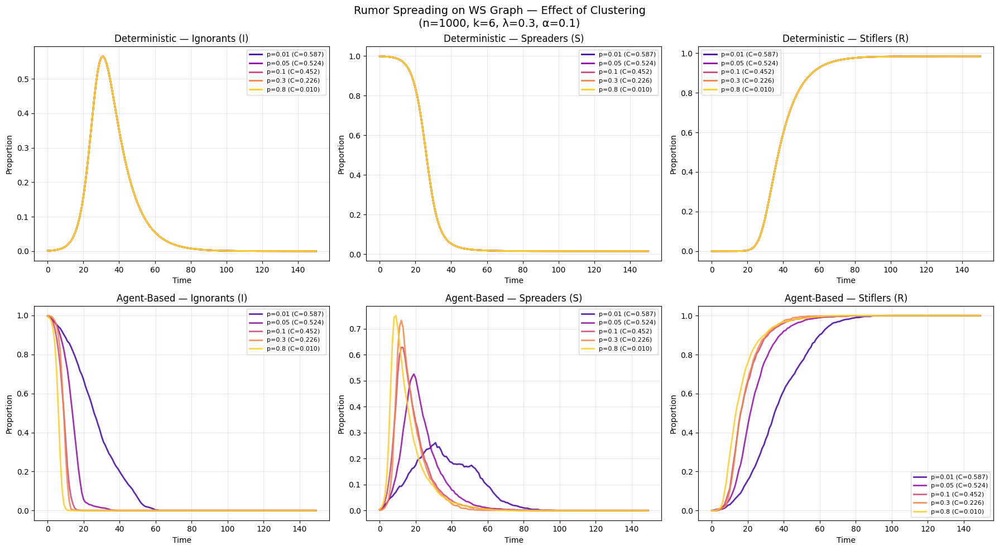

In [28]:
t_ws   = np.arange(T_ws + 1)
t_ag   = np.arange(T_ws)
colors_ws = plt.cm.plasma(np.linspace(0.1, 0.9, len(p_values)))

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle(
    f"Rumor Spreading on WS Graph — Effect of Clustering\n"
    f"(n={ws_n}, k={ws_k}, λ={lamb_ws}, α={alpha_ws})",
    fontsize=14
)

compartments = ["Ignorants (I)", "Spreaders (S)", "Stiflers (R)"]

# Row 0: (deterministic)
for ax, comp in zip(axes[0], compartments):
    ax.set_title(f"Deterministic — {comp}")
    ax.set_xlabel("Time")
    ax.set_ylabel("Proportion")
    ax.grid(True, alpha=0.3)

for i, p in enumerate(p_values):
    I_d, S_d, R_d = ws_det[p]
    lbl = f"p={p} (C={ws_clust[p]:.3f})"
    axes[0][0].plot(t_ws, I_d, color=colors_ws[i], lw=2, label=lbl)
    axes[0][1].plot(t_ws, S_d, color=colors_ws[i], lw=2, label=lbl)
    axes[0][2].plot(t_ws, R_d, color=colors_ws[i], lw=2, label=lbl)

# Row 1: Agent-based (network simulation)
for ax, comp in zip(axes[1], compartments):
    ax.set_title(f"Agent-Based — {comp}")
    ax.set_xlabel("Time")
    ax.set_ylabel("Proportion")
    ax.grid(True, alpha=0.3)

for i, p in enumerate(p_values):
    I_a, S_a, R_a = ws_agent[p]
    lbl = f"p={p} (C={ws_clust[p]:.3f})"
    axes[1][0].plot(t_ag, I_a, color=colors_ws[i], lw=2, alpha=0.85, label=lbl)
    axes[1][1].plot(t_ag, S_a, color=colors_ws[i], lw=2, alpha=0.85, label=lbl)
    axes[1][2].plot(t_ag, R_a, color=colors_ws[i], lw=2, alpha=0.85, label=lbl)

for ax in axes.flat:
    ax.legend(fontsize=8)

plt.tight_layout()
plt.show()

### 7c. GIF Visualizations — Low vs High Clustering

In [30]:
import importlib
import RumorVisual
importlib.reload(RumorVisual)

# Build fresh 100-node WS graphs for the GIFs
ws_n_gif = 100
gif_cases = {
    "WS_LowCluster_100": (
        p_values[0],
        nx.watts_strogatz_graph(ws_n_gif, ws_k, p_values[0], seed=42),
    ),
    "WS_HighCluster_100": (
        p_values[-1],
        nx.watts_strogatz_graph(ws_n_gif, ws_k, p_values[-1], seed=42),
    ),
}

gif_num_steps = 100
for name, (p, G) in gif_cases.items():
    c = nx.average_clustering(G)
    print(f"\n--- {name}  (p={p}, C={c:.3f}, N={ws_n_gif}) ---")
    RumorVisual.visualize_rumor(G, name, lamb_ws, alpha_ws, gif_num_steps)


--- WS_LowCluster_100  (p=0.01, C=0.571, N=100) ---
[INFO] Visualizing WS_LowCluster_100 (λ=0.3, α=0.1)
[INFO] Initial patient zero: 19


Simulating rumor spread on WS_LowCluster_100:  15%|█▌        | 15/100 [00:03<00:19,  4.29it/s]

[INFO] Epidemic ended at step 16
[INFO] Creating GIF...


[INFO] GIF saved as 'output\WS_LowCluster_100_Rumor_animation.gif'
[INFO] Frames directory deleted.

--- WS_HighCluster_100  (p=0.8, C=0.063, N=100) ---
[INFO] Visualizing WS_HighCluster_100 (λ=0.3, α=0.1)
[INFO] Initial patient zero: 20


Simulating rumor spread on WS_HighCluster_100:   8%|▊         | 8/100 [00:02<00:25,  3.66it/s]

[INFO] Epidemic ended at step 9
[INFO] Creating GIF...


[INFO] GIF saved as 'output\WS_HighCluster_100_Rumor_animation.gif'
[INFO] Frames directory deleted.


--- WS_LowCluster_100 ---


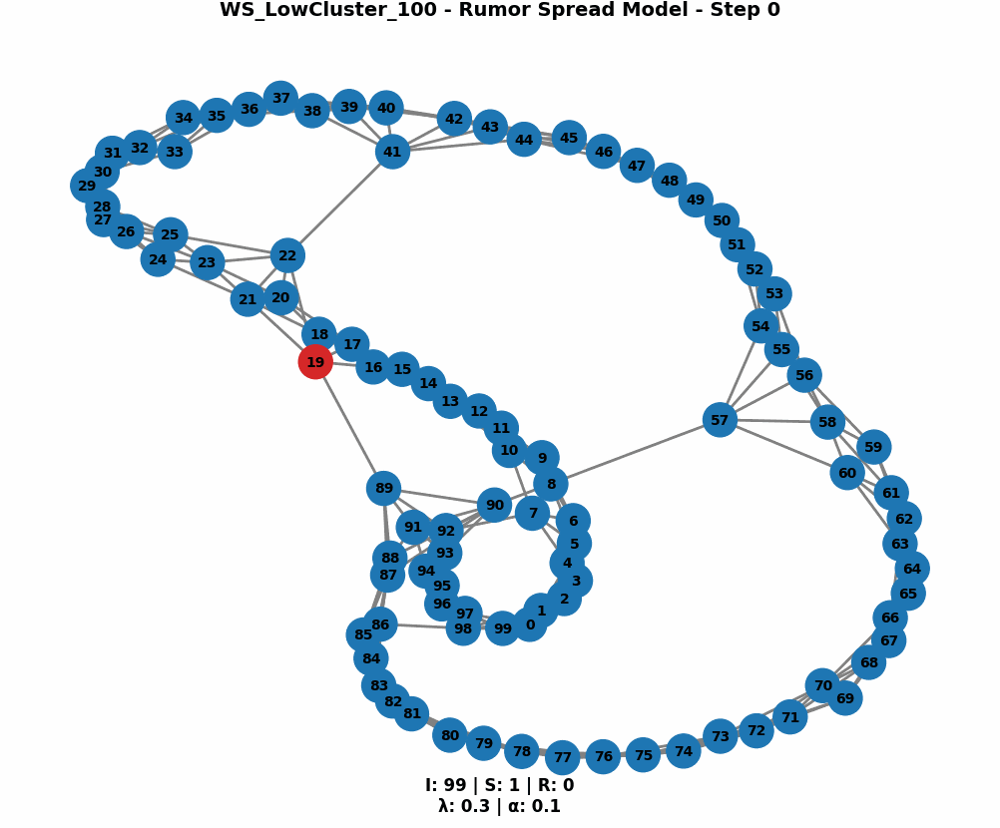

--- WS_HighCluster_100 ---


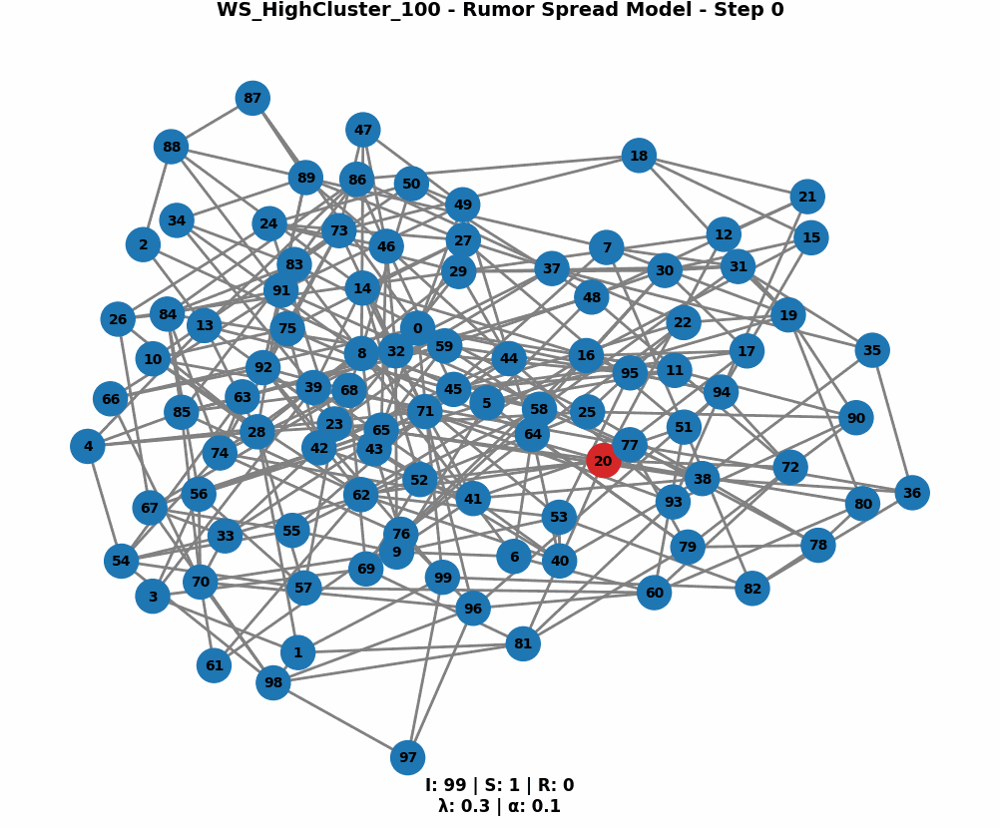

In [31]:
from IPython.display import Image, display

for name in gif_cases:
    print(f"--- {name} ---")
    display(Image(filename=f"output/{name}_Rumor_animation.gif"))